In [12]:
import logging
import os
import sys
from pathlib import Path
from typing import Tuple

import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Add the parent directory to the Python path to allow importing vbase_utils
# when running this scample interactively.
# pylint: disable=wrong-import-position
# sys.path.insert(0, os.path.abspath(os.path.join(os.path.dirname(__file__), "..")))
from vbase_utils.stats.pit_robust_betas import pit_robust_betas

# Configure logging
logging.basicConfig(
    level=logging.INFO, format="%(asctime)s - %(levelname)s - %(message)s"
)
logger = logging.getLogger(__name__)

# Define cache file path
CACHE_DIR = Path.home() / "tmp"
CACHE_FILE = CACHE_DIR / "stock_market_sector_resids.pkl"

# Define sector ETFs and their descriptions
SECTOR_ETFS = {
    "XLK": "Technology",
    "XLF": "Financials",
    "XLV": "Healthcare",
    "XLE": "Energy",
    "XLI": "Industrials",
    "XLP": "Consumer Staples",
    "XLY": "Consumer Discretionary",
    "XLB": "Materials",
    "XLU": "Utilities",
    "XLRE": "Real Estate",
    "XLC": "Communication Services",
}

# Define individual stocks and their sector ETFs
STOCK_SECTOR_MAP = {
    "MSFT": "XLK",  # Technology
    "AAPL": "XLK",  # Technology
    "XOM": "XLE",  # Energy
    "JPM": "XLF",  # Financials
    "JNJ": "XLV",  # Healthcare
    "CAT": "XLI",  # Industrials
    "PG": "XLP",  # Consumer Staples
    "AMZN": "XLY",  # Consumer Discretionary
    "ECL": "XLB",  # Materials
    "NEE": "XLU",  # Utilities
    "PLD": "XLRE",  # Real Estate
    "GOOGL": "XLC",  # Communication Services
}


def plot_cumulative_residuals(
    residuals: pd.DataFrame, title: str, figsize: Tuple[int, int] = (15, 8)
) -> None:
    """Plot cumulative residuals for a set of assets.

    Args:
        residuals: DataFrame of residuals to plot.
        title: Title for the plot.
        figsize: Figure size as (width, height).
    """
    cum_residuals = (1 + residuals).cumprod() - 1

    plt.figure(figsize=figsize)
    for col in cum_residuals.columns:
        plt.plot(cum_residuals.index, cum_residuals[col], label=col)

    plt.title(title)
    plt.xlabel("Date")
    plt.ylabel("Cumulative Residual Return")
    plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
    plt.grid(True)
    plt.tight_layout()
    plt.show()


# Load historical returns from a local CSV file
df_russel_rets = pd.read_csv(
    # os.path.join(os.path.expanduser("~"), "tmp", 
                 "data/russel_etf_returns.csv",
    index_col=0,
    parse_dates=True,
)
df_style_rets = pd.read_csv(
    # os.path.join(os.path.expanduser("~"), "tmp", 
                 "data/style_etf market_returns.csv",
    index_col=0,
    parse_dates=True,
)

df_rets = pd.merge(df_russel_rets,df_style_rets,left_index=True, right_index=True)


# Make sure the index is datetime and handle timezone-aware dates
df_rets.index = pd.to_datetime(df_rets.index, utc=True).tz_localize(None)

# # Subset the data to the symbols we want to analyze
# symbols = ["SPY"] + list(SECTOR_ETFS.keys()) + list(STOCK_SECTOR_MAP.keys())
# df_rets = df_rets[symbols]

# # Pick Friday as the rebalancing day
weekly_rebalance = pd.DatetimeIndex([dt for dt in df_rets.index if dt.weekday() == 4])

# Prepare data for market beta calculation
market_returns = df_rets[["IWV"]]
asset_returns = df_rets.drop("IWV", axis=1)

# # Calculate market betas and residuals
market_results = pit_robust_betas(
    df_asset_rets=asset_returns,
    df_fact_rets=market_returns,
    # Approximately 6 months.
    half_life=126,
    # Approximately 3 months.
    min_timestamps=63,
    rebalance_time_index=weekly_rebalance,
    progress=True,
)
market_residuals = market_results["df_asset_resids"]

# # Drop the initial NA rows
market_residuals = market_residuals.dropna(how="all")

# # Plot sector ETF residuals


# # Calculate sector residuals
# # Initialize dictionary to store sector results
# sector_results = {}
# # Calculate sector betas for each stock
# for stock, sector_etf in STOCK_SECTOR_MAP.items():
#     # Get residuals for stock and its sector ETF
#     stock_residuals = market_residuals[[stock]]
#     sector_residuals = market_residuals[[sector_etf]]
#     # Calculate sector betas
#     sector_results_stock = pit_robust_betas(
#         df_asset_rets=stock_residuals,
#         df_fact_rets=sector_residuals,
#         half_life=126,
#         min_timestamps=63,
#         rebalance_time_index=weekly_rebalance[
#             weekly_rebalance >= stock_residuals.index.min()
#         ],
#         progress=True,
#     )
#     sector_results[stock] = sector_results_stock

# # Plot individual stock residuals
# stock_residuals = market_residuals[list(STOCK_SECTOR_MAP.keys())]
# plot_cumulative_residuals(
#     stock_residuals, "Cumulative Residual Returns: Individual Stocks vs SPY"
# )

# # Plot all the sources of returns for a stock.
# STOCK = "JPM"
# # Build a DataFrame with the stock and its return components.
# df_component_rets = pd.DataFrame(
#     {
#         "Stock Return": df_rets[STOCK],
#         "Market Return Component": -market_results["df_hedge_rets"][STOCK],
#         "Sector Return Component": -sector_results[STOCK]["df_hedge_rets"][STOCK],
#         "Residual Return Component": sector_results[STOCK]["df_asset_resids"][STOCK],
#     }
# )
# # Ensure all series are aligned to the same timestamp index.
# df_component_rets = df_component_rets.dropna()
# plot_cumulative_residuals(df_component_rets, f"Cumulative Return Components: {STOCK}")
# # Print correlation matrix.
# print(df_component_rets.corr())


Simulating:   0%|          | 0/782 [00:00<?, ?timestamp/s]2025-07-08 12:25:55,255 - WARNING - Insufficient data: 4 timestamps available, minimum required is 63.
2025-07-08 12:25:55,260 - WARNING - Insufficient data: 9 timestamps available, minimum required is 63.
2025-07-08 12:25:55,264 - WARNING - Insufficient data: 13 timestamps available, minimum required is 63.
2025-07-08 12:25:55,268 - WARNING - Insufficient data: 18 timestamps available, minimum required is 63.
2025-07-08 12:25:55,272 - WARNING - Insufficient data: 23 timestamps available, minimum required is 63.
2025-07-08 12:25:55,275 - WARNING - Insufficient data: 28 timestamps available, minimum required is 63.
2025-07-08 12:25:55,298 - WARNING - Insufficient data: 32 timestamps available, minimum required is 63.
2025-07-08 12:25:55,302 - WARNING - Insufficient data: 37 timestamps available, minimum required is 63.
2025-07-08 12:25:55,312 - WARNING - Insufficient data: 42 timestamps available, minimum required is 63.
2025-07-

/var/folders/6x/xp45m8ws0zj3yl7vwtwgbs8c0000gn/T/ipykernel_87382/1316665747.py:79: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


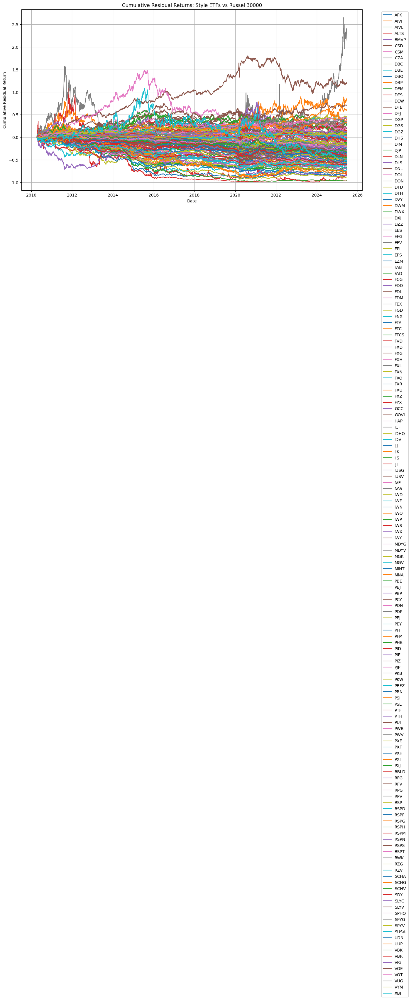

In [13]:
sector_etf_residuals = market_residuals
plot_cumulative_residuals(
    sector_etf_residuals, "Cumulative Residual Returns: Style ETFs vs Russel 30000"
)

In [17]:
def comp_ret(x):
    return (1 + x).prod() - 1

In [75]:
block_size = 20
column_blocks = [
    market_residuals.columns[i:i + block_size]
    for i in range(0, len(market_residuals.columns), block_size)
]

In [79]:
len(column_blocks)

8

In [57]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import acf, pacf

top_assets = market_residuals.columns[:]
lags = 5

weekly_returns = market_residuals.resample("W").apply(lambda x: (1 + x).prod() - 1)
monthly_returns = market_residuals.resample("M").apply(lambda x: (1 + x).prod() - 1)

#ACF/PACF
def compute_acf_table(df, lags=5):
    return pd.DataFrame({
        col: acf(df[col].dropna(), nlags=lags, fft=True)[1:lags+1]
        for col in df.columns
    }, index=[f"lag_{i}" for i in range(1, lags + 1)])

def compute_pacf_table(df, lags=5):
    return pd.DataFrame({
        col: pacf(df[col].dropna(), nlags=lags)[1:lags+1]
        for col in df.columns
    }, index=[f"lag_{i}" for i in range(1, lags + 1)])


acf_daily = compute_acf_table(market_residuals[top_assets])
acf_weekly = compute_acf_table(weekly_returns[top_assets])
acf_monthly = compute_acf_table(monthly_returns[top_assets])

pacf_daily = compute_pacf_table(market_residuals[top_assets])
pacf_weekly = compute_pacf_table(weekly_returns[top_assets])
pacf_monthly = compute_pacf_table(monthly_returns[top_assets])

# 95% CI
ci_daily = 1.96 / np.sqrt(len(market_residuals))
ci_weekly = 1.96 / np.sqrt(len(weekly_returns))
ci_monthly = 1.96 / np.sqrt(len(monthly_returns))


/var/folders/6x/xp45m8ws0zj3yl7vwtwgbs8c0000gn/T/ipykernel_87382/2493992043.py:11: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_returns = market_residuals.resample("M").apply(lambda x: (1 + x).prod() - 1)


In [95]:
market_residuals.to_csv("market_residual data.csv")

In [77]:
def plot_acf_pacf_grid_2n3(
    acf_d, acf_w, acf_m,
    pacf_d, pacf_w, pacf_m,
    ci_d, ci_w, ci_m,
    asset_cols
):
    n = len(asset_cols)
    fig, axes = plt.subplots(2 * n, 3, figsize=(20, 5 * 2 * n), sharey='col')

    for i, col in enumerate(asset_cols):
        # ACF row
        axes[2*i, 0].bar(acf_d.index, acf_d[col], color='skyblue')
        axes[2*i, 0].axhline(ci_d, color='red', linestyle='--')
        axes[2*i, 0].axhline(-ci_d, color='red', linestyle='--')
        axes[2*i, 0].set_title(f"{col} - Daily ACF")
        axes[2*i, 0].grid(True)
        axes[2*i, 0].set_ylim(-1, 1)

        axes[2*i, 1].bar(acf_w.index, acf_w[col], color='skyblue')
        axes[2*i, 1].axhline(ci_w, color='red', linestyle='--')
        axes[2*i, 1].axhline(-ci_w, color='red', linestyle='--')
        axes[2*i, 1].set_title(f"{col} - Weekly ACF")
        axes[2*i, 1].grid(True)
        axes[2*i, 1].set_ylim(-1, 1)

        axes[2*i, 2].bar(acf_m.index, acf_m[col], color='skyblue')
        axes[2*i, 2].axhline(ci_m, color='red', linestyle='--')
        axes[2*i, 2].axhline(-ci_m, color='red', linestyle='--')
        axes[2*i, 2].set_title(f"{col} - Monthly ACF")
        axes[2*i, 2].grid(True)
        axes[2*i, 2].set_ylim(-1, 1)

        # PACF row
        axes[2*i + 1, 0].bar(pacf_d.index, pacf_d[col], color='lightgreen')
        axes[2*i + 1, 0].axhline(ci_d, color='red', linestyle='--')
        axes[2*i + 1, 0].axhline(-ci_d, color='red', linestyle='--')
        axes[2*i + 1, 0].set_title(f"{col} - Daily PACF")
        axes[2*i + 1, 0].grid(True)
        axes[2*i + 1, 0].set_ylim(-1, 1)

        axes[2*i + 1, 1].bar(pacf_w.index, pacf_w[col], color='lightgreen')
        axes[2*i + 1, 1].axhline(ci_w, color='red', linestyle='--')
        axes[2*i + 1, 1].axhline(-ci_w, color='red', linestyle='--')
        axes[2*i + 1, 1].set_title(f"{col} - Weekly PACF")
        axes[2*i + 1, 1].grid(True)
        axes[2*i + 1, 1].set_ylim(-1, 1)

        axes[2*i + 1, 2].bar(pacf_m.index, pacf_m[col], color='lightgreen')
        axes[2*i + 1, 2].axhline(ci_m, color='red', linestyle='--')
        axes[2*i + 1, 2].axhline(-ci_m, color='red', linestyle='--')
        axes[2*i + 1, 2].set_title(f"{col} - Monthly PACF")
        axes[2*i + 1, 2].grid(True)
        axes[2*i + 1, 2].set_ylim(-1, 1)

    plt.tight_layout()
    plt.show()

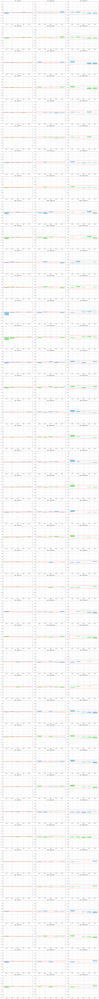

In [81]:
plot_acf_pacf_grid_2n3(
    acf_daily, acf_weekly, acf_monthly,
    pacf_daily, pacf_weekly, pacf_monthly,
    ci_daily, ci_weekly, ci_monthly,
    column_blocks[0]
)

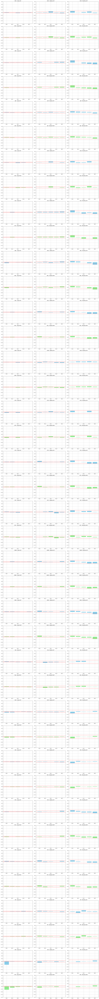

In [82]:
plot_acf_pacf_grid_2n3(
    acf_daily, acf_weekly, acf_monthly,
    pacf_daily, pacf_weekly, pacf_monthly,
    ci_daily, ci_weekly, ci_monthly,
    column_blocks[1]
)

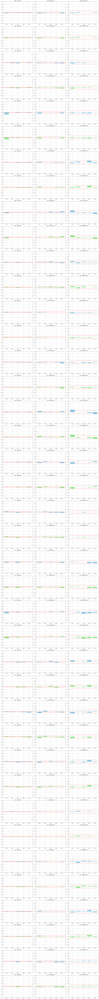

In [83]:
plot_acf_pacf_grid_2n3(
    acf_daily, acf_weekly, acf_monthly,
    pacf_daily, pacf_weekly, pacf_monthly,
    ci_daily, ci_weekly, ci_monthly,
    column_blocks[2]
)

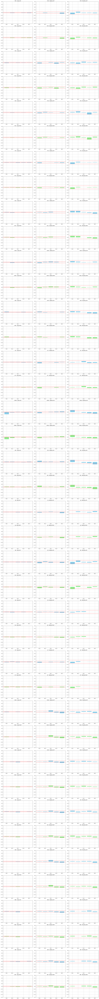

In [84]:
plot_acf_pacf_grid_2n3(
    acf_daily, acf_weekly, acf_monthly,
    pacf_daily, pacf_weekly, pacf_monthly,
    ci_daily, ci_weekly, ci_monthly,
    column_blocks[3]
)

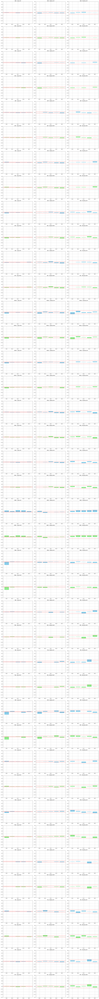

In [85]:
plot_acf_pacf_grid_2n3(
    acf_daily, acf_weekly, acf_monthly,
    pacf_daily, pacf_weekly, pacf_monthly,
    ci_daily, ci_weekly, ci_monthly,
    column_blocks[4]
)

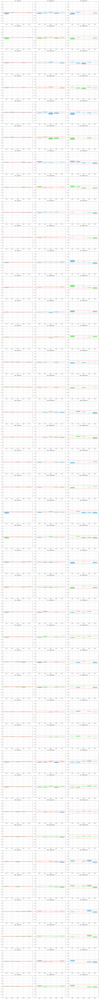

In [86]:
plot_acf_pacf_grid_2n3(
    acf_daily, acf_weekly, acf_monthly,
    pacf_daily, pacf_weekly, pacf_monthly,
    ci_daily, ci_weekly, ci_monthly,
    column_blocks[5]
)

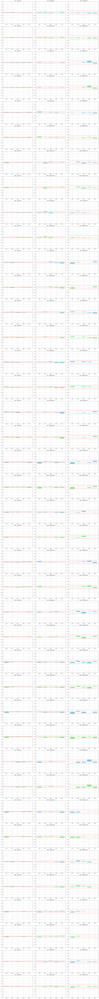

In [87]:
plot_acf_pacf_grid_2n3(
    acf_daily, acf_weekly, acf_monthly,
    pacf_daily, pacf_weekly, pacf_monthly,
    ci_daily, ci_weekly, ci_monthly,
    column_blocks[6]
)

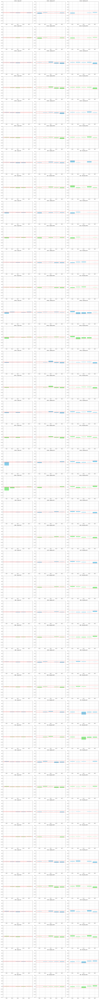

In [88]:
plot_acf_pacf_grid_2n3(
    acf_daily, acf_weekly, acf_monthly,
    pacf_daily, pacf_weekly, pacf_monthly,
    ci_daily, ci_weekly, ci_monthly,
    column_blocks[7]
)

In [89]:
acf_daily

,AFK,AIVI,AIVL,ALTS,BMVP,CSD,CSM,CZA,DBC,DBE,...,UDN,UUP,VBK,VBR,VIG,VOE,VOT,VUG,VYM,XBI
lag_1,-0.095960,0.028210,0.021141,-0.056702,-0.156995,-0.060632,-0.281662,-0.111929,0.000407,-0.010027,...,0.003276,-0.000568,0.003798,0.017997,-0.002965,0.044666,-0.007051,0.008436,0.043438,0.012607
lag_2,0.012553,0.035000,-0.028820,-0.028688,-0.007950,0.053516,-0.049965,-0.044507,-0.021431,-0.026439,...,0.011536,0.008848,0.005263,-0.015188,-0.037381,-0.028473,-0.011010,-0.031309,-0.033566,0.003942
lag_3,-0.020454,-0.020419,-0.012010,-0.037111,0.040551,-0.030714,0.024557,0.030320,-0.006095,-0.020844,...,-0.020661,-0.016850,-0.046662,-0.048214,-0.022811,-0.038872,-0.040697,-0.048036,-0.064836,-0.022746
lag_4,0.046232,-0.016221,-0.026587,-0.023508,-0.035183,-0.012982,-0.003527,0.009634,-0.001470,0.027855,...,-0.007361,-0.007622,-0.037327,-0.002856,-0.040120,-0.019273,-0.039615,-0.003435,-0.024794,-0.033046
lag_5,0.022333,0.018569,-0.002420,0.027710,-0.007331,-0.012524,0.038223,-0.045066,0.023805,0.025654,...,0.006767,0.002181,-0.012768,-0.024975,-0.010910,-0.020943,0.018311,0.021699,0.005512,0.011566


In [37]:


def count_acf_directions_by_lag(df, freq_label, lags=5):
    """
    Count significant positive and negative ACF hits per lag for a given frequency.
    Returns a DataFrame with MultiIndex: (direction ∈ {positive, negative}, lag ∈ lag_1~lag_n).
    """
    if freq_label == "daily":
        returns = df
    elif freq_label == "weekly":
        returns = df.resample("W").apply(lambda x: (1 + x).prod() - 1)
    elif freq_label == "monthly":
        returns = df.resample("M").apply(lambda x: (1 + x).prod() - 1)
    else:
        raise ValueError("freq_label must be one of: daily, weekly, monthly")

    # Compute ACF
    acf_table = pd.DataFrame({
        col: [returns[col].autocorr(lag=lag) for lag in range(1, lags + 1)]
        for col in returns.columns
    }, index=[f"lag_{i}" for i in range(1, lags + 1)])

    ci = 1.96 / np.sqrt(len(returns))

    # Count positives and negatives separately
    positive_hits = (acf_table > ci).sum(axis=1)
    negative_hits = (acf_table < -ci).sum(axis=1)

    # Combine using MultiIndex
    data = pd.concat([positive_hits, negative_hits], axis=1).T
    data.index = pd.MultiIndex.from_product([[freq_label], ["positive", "negative"]],
                                            names=["frequency", "direction"])

    return data

# Compute for all frequencies
daily_hits = count_acf_directions_by_lag(market_residuals, "daily")
weekly_hits = count_acf_directions_by_lag(market_residuals, "weekly")
monthly_hits = count_acf_directions_by_lag(market_residuals, "monthly")

# Combine
acf_multi_summary = pd.concat([daily_hits, weekly_hits, monthly_hits])
print(acf_multi_summary)

/var/folders/6x/xp45m8ws0zj3yl7vwtwgbs8c0000gn/T/ipykernel_87382/1790487538.py:14: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  returns = df.resample("M").apply(lambda x: (1 + x).prod() - 1)


                     lag_1  lag_2  lag_3  lag_4  lag_5
frequency direction                                   
daily     positive      20     10      3      7     12
          negative      54     18     64     28     16
weekly    positive      14      3     15      2      2
          negative      34      7      3     21     46
monthly   positive      14      1      1      6      2
          negative       9      1      6      6     15


In [ ]:


def count_acf_directions_by_lag(df, freq_label, lags=5):
    """
    Count significant positive and negative ACF hits per lag for a given frequency.
    Returns a DataFrame with MultiIndex: (direction ∈ {positive, negative}, lag ∈ lag_1~lag_n).
    """
    if freq_label == "daily":
        returns = df
    elif freq_label == "weekly":
        returns = df.resample("W").apply(lambda x: (1 + x).prod() - 1)
    elif freq_label == "monthly":
        returns = df.resample("M").apply(lambda x: (1 + x).prod() - 1)
    else:
        raise ValueError("freq_label must be one of: daily, weekly, monthly")

    # Compute ACF
    acf_table = pd.DataFrame({
        col: [returns[col].autocorr(lag=lag) for lag in range(1, lags + 1)]
        for col in returns.columns
    }, index=[f"lag_{i}" for i in range(1, lags + 1)])

    ci = 1.96 / np.sqrt(len(returns))

    # Count positives and negatives separately
    positive_hits = (acf_table > ci).sum(axis=1)
    negative_hits = (acf_table < -ci).sum(axis=1)

    # Combine using MultiIndex
    data = pd.concat([positive_hits, negative_hits], axis=1).T
    data.index = pd.MultiIndex.from_product([[freq_label], ["positive", "negative"]],
                                            names=["frequency", "direction"])

    return data

# Compute for all frequencies
daily_hits = count_acf_directions_by_lag(market_residuals, "daily")
weekly_hits = count_acf_directions_by_lag(market_residuals, "weekly")
monthly_hits = count_acf_directions_by_lag(market_residuals, "monthly")

# Combine
acf_multi_summary = pd.concat([daily_hits, weekly_hits, monthly_hits])
print(acf_multi_summary)

/var/folders/6x/xp45m8ws0zj3yl7vwtwgbs8c0000gn/T/ipykernel_87382/1790487538.py:14: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  returns = df.resample("M").apply(lambda x: (1 + x).prod() - 1)


                     lag_1  lag_2  lag_3  lag_4  lag_5
frequency direction                                   
daily     positive      20     10      3      7     12
          negative      54     18     64     28     16
weekly    positive      14      3     15      2      2
          negative      34      7      3     21     46
monthly   positive      14      1      1      6      2
          negative       9      1      6      6     15


In [68]:

def count_hits(table, threshold):
    hit_pos = (table > threshold).sum(axis=1)
    hit_neg = (table < -threshold).sum(axis=1)
    return hit_pos, hit_neg

def make_hit_summary(acf_or_pacf_tables, cis, label):
    summary_rows = []

    for freq_label in ['daily', 'weekly', 'monthly']:
        df = acf_or_pacf_tables[freq_label]
        ci = cis[freq_label]
        pos, neg = count_hits(df, ci)

        summary_rows.append(pd.DataFrame({
            'frequency': freq_label,
            'direction': 'positive',
            **pos.to_dict()
        }, index=[0]))

        summary_rows.append(pd.DataFrame({
            'frequency': freq_label,
            'direction': 'negative',
            **neg.to_dict()
        }, index=[0]))

    result = pd.concat(summary_rows).set_index(['frequency', 'direction'])
    print(f"\n📊 {label.upper()} HIT SUMMARY")
    return result

acf_tables = {
    'daily': acf_daily,
    'weekly': acf_weekly,
    'monthly': acf_monthly
}
pacf_tables = {
    'daily': pacf_daily,
    'weekly': pacf_weekly,
    'monthly': pacf_monthly
}
cis = {
    'daily': ci_daily,
    'weekly': ci_weekly,
    'monthly': ci_monthly
}

# ACF Summary
acf_summary = make_hit_summary(acf_tables, cis, label='ACF')
display(acf_summary)

# PACF Summary
pacf_summary = make_hit_summary(pacf_tables, cis, label='PACF')
display(pacf_summary)



📊 ACF HIT SUMMARY


lag_1  lag_2  lag_3  lag_4  lag_5
frequency direction                                   
daily     positive      20     10      3      7     12
          negative      54     18     64     28     16
weekly    positive      14      3     15      1      2
          negative      34      7      3     21     45
monthly   positive      14      1      1      6      2
          negative       9      1      6      5     10


📊 PACF HIT SUMMARY


lag_1  lag_2  lag_3  lag_4  lag_5
frequency direction                                   
daily     positive      20      6      3      7     11
          negative      54     27     65     27     19
weekly    positive      14      3     15      1      2
          negative      34      7      3     19     50
monthly   positive      14      1      0      6      1
          negative       9      1      5      5      5

/Users/yunhojeon/Library/Python/3.11/lib/python/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


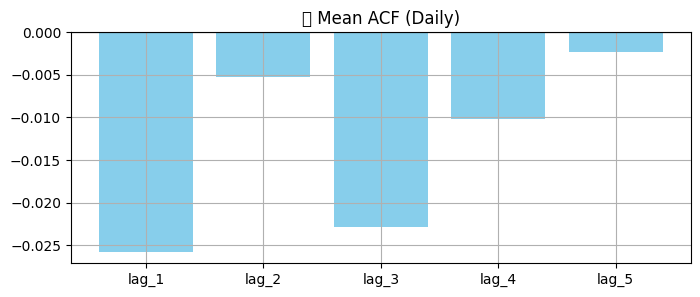

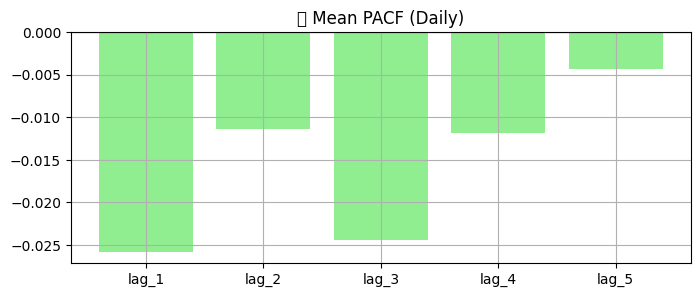

/Users/yunhojeon/Library/Python/3.11/lib/python/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128230 (\N{PACKAGE}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


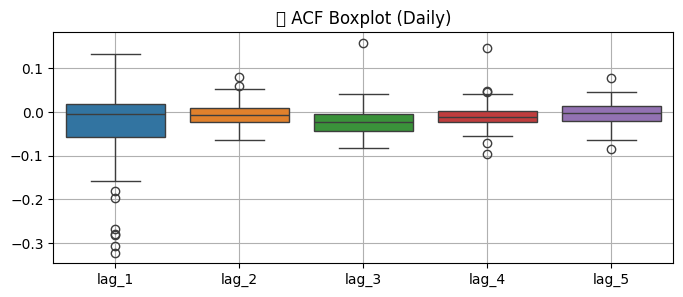

/Users/yunhojeon/Library/Python/3.11/lib/python/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128230 (\N{PACKAGE}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


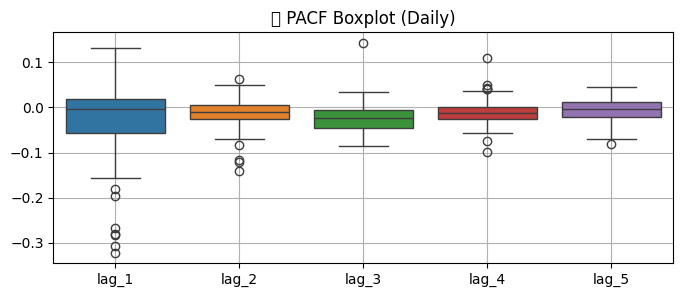

/Users/yunhojeon/Library/Python/3.11/lib/python/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128293 (\N{FIRE}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


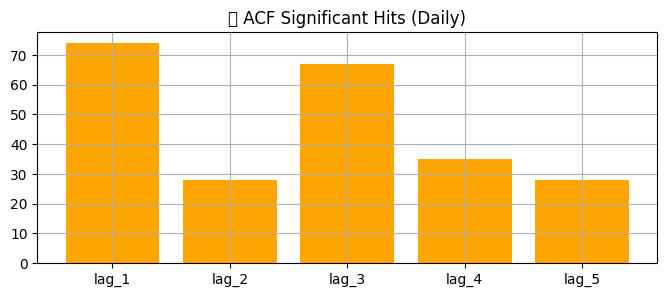

/Users/yunhojeon/Library/Python/3.11/lib/python/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128293 (\N{FIRE}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


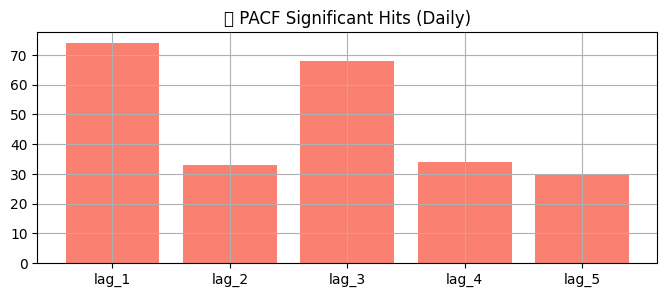

/Users/yunhojeon/Library/Python/3.11/lib/python/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


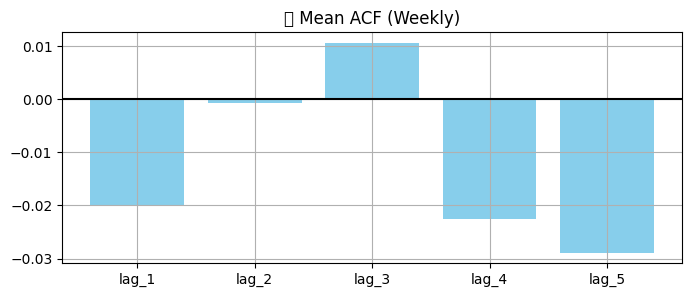

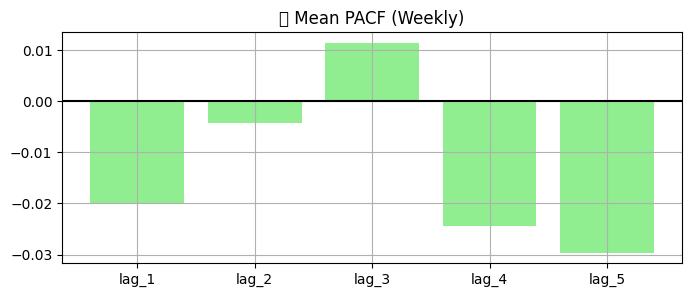

/Users/yunhojeon/Library/Python/3.11/lib/python/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128230 (\N{PACKAGE}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


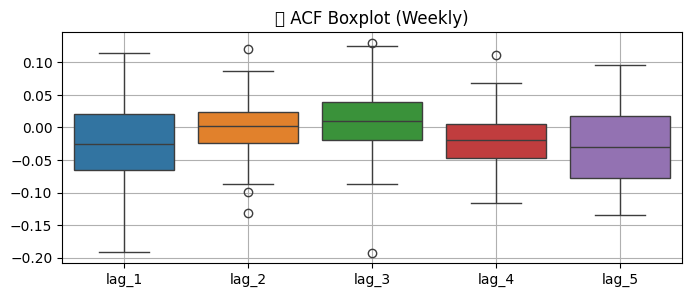

/Users/yunhojeon/Library/Python/3.11/lib/python/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128230 (\N{PACKAGE}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


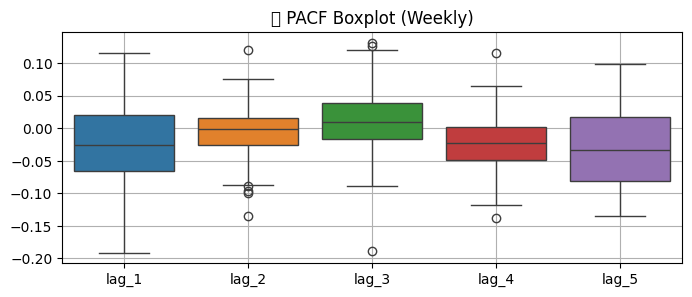

/Users/yunhojeon/Library/Python/3.11/lib/python/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128293 (\N{FIRE}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


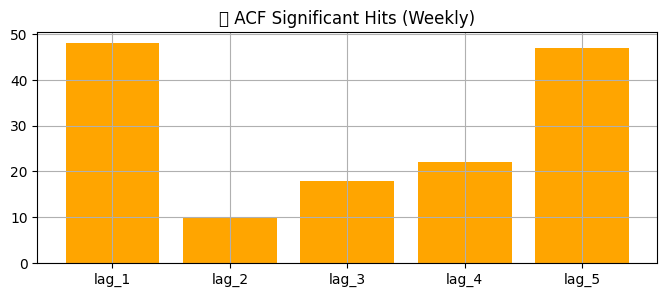

/Users/yunhojeon/Library/Python/3.11/lib/python/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128293 (\N{FIRE}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


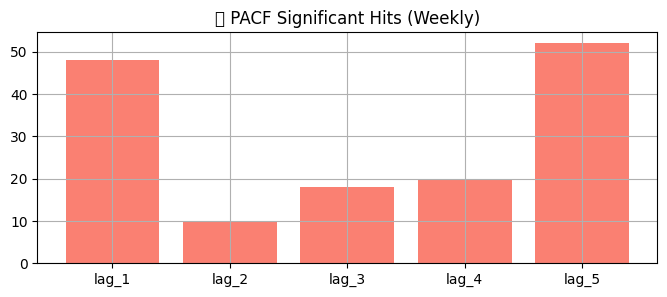

/Users/yunhojeon/Library/Python/3.11/lib/python/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


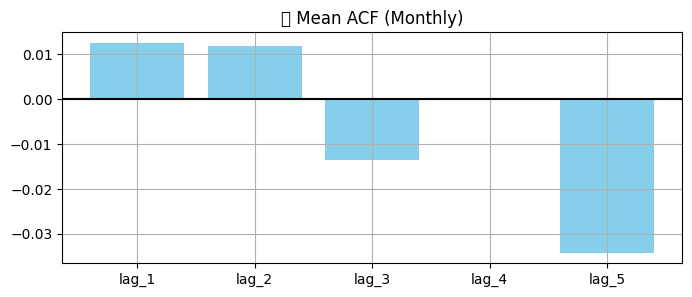

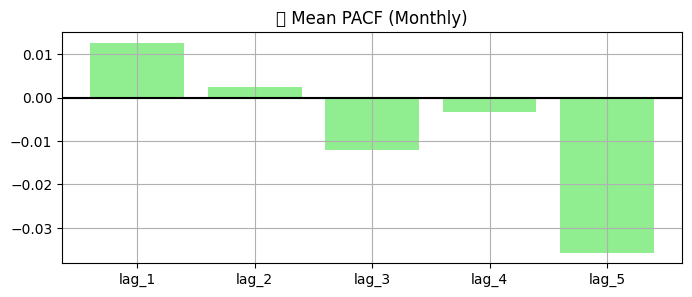

/Users/yunhojeon/Library/Python/3.11/lib/python/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128230 (\N{PACKAGE}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


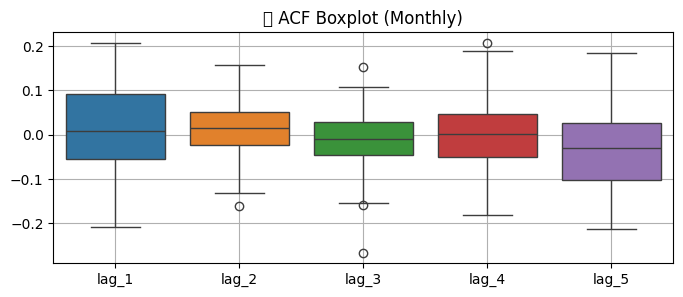

/Users/yunhojeon/Library/Python/3.11/lib/python/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128230 (\N{PACKAGE}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


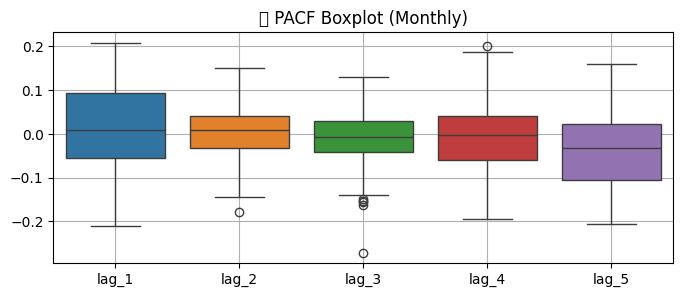

/Users/yunhojeon/Library/Python/3.11/lib/python/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128293 (\N{FIRE}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


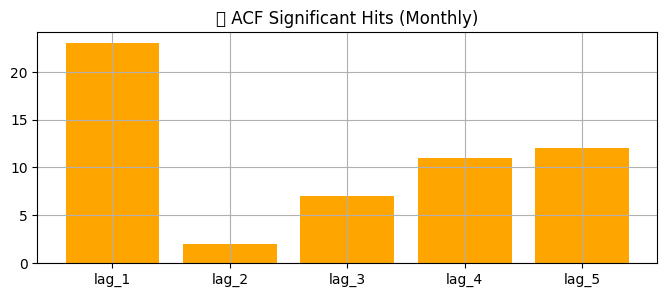

/Users/yunhojeon/Library/Python/3.11/lib/python/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128293 (\N{FIRE}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


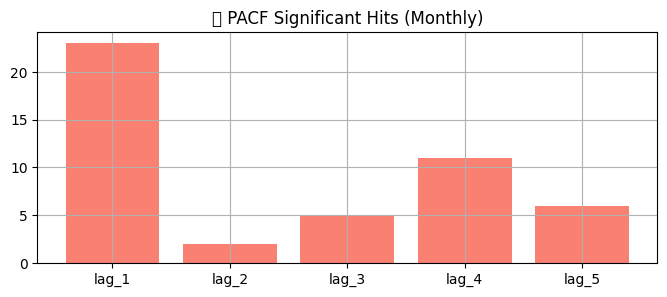

In [91]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_mean_box_hit(acf_dict, pacf_dict, ci_dict, freq_label):
    acf = acf_dict[freq_label]
    pacf = pacf_dict[freq_label]
    ci = ci_dict[freq_label]

    acf_mean = acf.mean(axis=1)
    pacf_mean = pacf.mean(axis=1)

    plt.figure(figsize=(8, 3))
    plt.bar(acf_mean.index, acf_mean.values, color='skyblue')
    plt.title(f"📊 Mean ACF ({freq_label.title()})")
    plt.axhline(0, color='black')
    plt.grid(True)
    plt.show()

    plt.figure(figsize=(8, 3))
    plt.bar(pacf_mean.index, pacf_mean.values, color='lightgreen')
    plt.title(f"📊 Mean PACF ({freq_label.title()})")
    plt.axhline(0, color='black')
    plt.grid(True)
    plt.show()

    plt.figure(figsize=(8, 3))
    sns.boxplot(data=acf.T)
    plt.title(f"📦 ACF Boxplot ({freq_label.title()})")
    plt.grid(True)
    plt.show()

    plt.figure(figsize=(8, 3))
    sns.boxplot(data=pacf.T)
    plt.title(f"📦 PACF Boxplot ({freq_label.title()})")
    plt.grid(True)
    plt.show()

    acf_hit = ((acf > ci) | (acf < -ci)).sum(axis=1)
    plt.figure(figsize=(8, 3))
    plt.bar(acf_hit.index, acf_hit.values, color='orange')
    plt.title(f"🔥 ACF Significant Hits ({freq_label.title()})")
    plt.grid(True)
    plt.show()

    pacf_hit = ((pacf > ci) | (pacf < -ci)).sum(axis=1)
    plt.figure(figsize=(8, 3))
    plt.bar(pacf_hit.index, pacf_hit.values, color='salmon')
    plt.title(f"🔥 PACF Significant Hits ({freq_label.title()})")
    plt.grid(True)
    plt.show()

acf_dict = {'daily': acf_daily, 'weekly': acf_weekly, 'monthly': acf_monthly}
pacf_dict = {'daily': pacf_daily, 'weekly': pacf_weekly, 'monthly': pacf_monthly}
ci_dict = {'daily': ci_daily, 'weekly': ci_weekly, 'monthly': ci_monthly}

for freq in ['daily', 'weekly', 'monthly']:
    plot_mean_box_hit(acf_dict, pacf_dict, ci_dict, freq)


In [ ]:
#### just to show the dataframe for eachc residuals.

In [15]:
market_residuals


,AFK,AIVI,AIVL,ALTS,BMVP,CSD,CSM,CZA,DBC,DBE,...,UDN,UUP,VBK,VBR,VIG,VOE,VOT,VUG,VYM,XBI
Date,,,,,,,,,,,,,,,,,,,,,
2010-04-12,0.007671,0.001828,-0.001208,-0.000751,-0.003501,0.005239,-0.000100,-0.002027,-0.003720,-0.006045,...,0.003866,-0.003606,0.002482,-0.000872,-0.000746,-0.001229,-0.001605,-0.000779,-0.000049,-0.005100
2010-04-13,-0.014826,0.000912,-0.000457,0.034483,0.002721,0.000000,0.001283,0.005057,0.003713,0.001129,...,0.001123,0.000000,0.001180,0.004468,0.001812,0.000597,0.001860,0.001057,0.000991,-0.000164
2010-04-14,-0.007447,-0.004004,-0.006209,0.050194,-0.000471,-0.004152,0.000368,0.004302,-0.000589,-0.000743,...,0.001417,-0.002523,0.006935,0.004917,-0.004229,-0.001134,0.000176,-0.001548,-0.002164,-0.001762
2010-04-15,0.002081,-0.002545,0.002784,0.024999,0.003363,0.006262,0.001948,0.001820,0.002435,0.000413,...,-0.003623,0.004092,0.003302,0.000023,0.001203,-0.003129,-0.001830,0.001388,0.000159,-0.003920
2010-04-16,0.001471,0.005506,0.002059,-0.023942,0.002487,-0.003767,-0.004218,0.010348,-0.003436,-0.000326,...,-0.000817,0.000264,0.004847,0.002374,0.003668,-0.000867,0.003429,0.001246,0.002139,0.007533
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-06-17,-0.005216,-0.007050,0.001195,-0.120456,0.001107,-0.000581,-0.001508,-0.002294,0.023831,0.039302,...,-0.006241,0.005947,0.002935,-0.000554,-0.000856,-0.000743,0.001860,0.003303,-0.002081,-0.005077
2025-06-18,0.007596,0.003215,0.000120,0.110057,-0.002460,0.004243,0.000237,0.000217,0.002542,0.003353,...,-0.001636,0.001841,0.006158,0.003967,-0.002164,0.001136,0.003572,-0.001842,0.001462,0.006597
2025-06-20,-0.000754,-0.009563,0.004080,0.036053,0.003236,0.003151,0.000516,0.002668,0.005701,0.007972,...,0.002308,-0.001227,0.001035,0.003470,0.000375,0.003269,0.003004,-0.002892,0.002934,-0.001369


In [10]:
df_rets

,IWV,AFK,AIVI,AIVL,ALTS,BMVP,CSD,CSM,CZA,DBC,...,UDN,UUP,VBK,VBR,VIG,VOE,VOT,VUG,VYM,XBI
Date,,,,,,,,,,,,,,,,,,,,,
2010-01-05,0.002561,0.002067,-0.004908,-0.001446,0.057269,0.001289,0.004199,0.004521,0.003370,0.001189,...,-0.000721,-0.000436,0.005067,-0.001081,-0.000632,0.003110,0.005666,0.002595,0.000000,0.003853
2010-01-06,0.001954,0.014781,0.000673,0.002173,-0.029167,0.001546,0.003660,0.001566,0.001679,0.017808,...,0.001804,-0.002619,0.002927,0.001623,0.000633,0.007086,0.007243,0.000370,0.002078,0.013343
2010-01-07,0.003449,-0.000677,-0.010307,0.000482,0.017167,0.001286,0.003125,0.003908,0.000838,-0.012442,...,-0.006484,0.006565,0.003081,0.008821,0.005058,0.007256,0.001998,0.001479,0.001814,0.000000
2010-01-08,0.003587,0.001695,0.012904,0.000963,0.016878,0.001027,-0.001558,-0.000973,-0.000419,-0.000787,...,0.007977,-0.006956,0.005819,0.003569,0.000000,0.003274,0.005782,0.006090,0.001812,0.004509
2010-01-11,0.000893,0.008799,0.002459,0.006256,0.066390,0.001796,0.007800,0.006234,0.005027,-0.003152,...,0.005755,-0.005254,-0.002089,-0.000534,0.005871,0.000870,-0.001189,-0.000917,0.004906,0.005387
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-06-17,-0.009362,-0.011729,-0.012120,-0.005673,-0.131579,-0.005640,-0.011448,-0.010759,-0.009912,0.021239,...,-0.006970,0.006618,-0.008424,-0.009559,-0.008053,-0.008168,-0.008451,-0.007931,-0.008990,-0.015233
2025-06-18,0.000207,0.007740,0.003327,0.000272,0.110303,-0.002311,0.004483,0.000441,0.000385,0.002600,...,-0.001620,0.001826,0.006408,0.004166,-0.002005,0.001300,0.003800,-0.001594,0.001614,0.006821
2025-06-20,-0.001860,-0.002048,-0.010570,0.002716,0.033843,0.001895,0.000992,-0.001322,0.001155,0.005186,...,0.002163,-0.001094,-0.001222,0.001681,-0.001055,0.001793,0.000956,-0.005124,0.001561,-0.003387


In [16]:
df_style_rets

,AFK,AIVI,AIVL,ALTS,BMVP,CSD,CSM,CZA,DBC,DBE,...,UDN,UUP,VBK,VBR,VIG,VOE,VOT,VUG,VYM,XBI
Date,,,,,,,,,,,,,,,,,,,,,
2010-01-05,0.002067,-0.004908,-0.001446,0.057269,0.001289,0.004199,0.004521,0.003370,0.001189,0.000000,...,-0.000721,-0.000436,0.005067,-0.001081,-0.000632,0.003110,0.005666,0.002595,0.000000,0.003853
2010-01-06,0.014781,0.000673,0.002173,-0.029167,0.001546,0.003660,0.001566,0.001679,0.017808,0.014590,...,0.001804,-0.002619,0.002927,0.001623,0.000633,0.007086,0.007243,0.000370,0.002078,0.013343
2010-01-07,-0.000677,-0.010307,0.000482,0.017167,0.001286,0.003125,0.003908,0.000838,-0.012442,-0.004056,...,-0.006484,0.006565,0.003081,0.008821,0.005058,0.007256,0.001998,0.001479,0.001814,0.000000
2010-01-08,0.001695,0.012904,0.000963,0.016878,0.001027,-0.001558,-0.000973,-0.000419,-0.000787,0.000370,...,0.007977,-0.006956,0.005819,0.003569,0.000000,0.003274,0.005782,0.006090,0.001812,0.004509
2010-01-11,0.008799,0.002459,0.006256,0.066390,0.001796,0.007800,0.006234,0.005027,-0.003152,-0.010363,...,0.005755,-0.005254,-0.002089,-0.000534,0.005871,0.000870,-0.001189,-0.000917,0.004906,0.005387
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-06-17,-0.011729,-0.012120,-0.005673,-0.131579,-0.005640,-0.011448,-0.010759,-0.009912,0.021239,0.036004,...,-0.006970,0.006618,-0.008424,-0.009559,-0.008053,-0.008168,-0.008451,-0.007931,-0.008990,-0.015233
2025-06-18,0.007740,0.003327,0.000272,0.110303,-0.002311,0.004483,0.000441,0.000385,0.002600,0.003426,...,-0.001620,0.001826,0.006408,0.004166,-0.002005,0.001300,0.003800,-0.001594,0.001614,0.006821
2025-06-20,-0.002048,-0.010570,0.002716,0.033843,0.001895,0.000992,-0.001322,0.001155,0.005186,0.007317,...,0.002163,-0.001094,-0.001222,0.001681,-0.001055,0.001793,0.000956,-0.005124,0.001561,-0.003387
